### feature extraction from img from front image


In [ ]:
# --- Install & Import ---
!pip install mediapipe opencv-python pandas tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.6 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of opencv-contrib-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 49.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 72.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 MB 9.6 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: numpy
    Found existing inst

In [ ]:


import cv2
import mediapipe as mp
import pandas as pd
import numpy as np
import os
from tqdm import tqdm

# --- Paths ---
IMAGE_DIR = "/content"   # folder with your images
LABELS_CSV = "/content/labels.csv"  # CSV with columns: filename,height,weight
all_images = sorted(os.listdir(IMAGE_DIR))  # list of actual images
total = len(all_images)-4  # = 102
print(total,"toatal img")
# --- Load Labels ---
labels_df = pd.read_csv(LABELS_CSV)

# --- MediaPipe Setup ---
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

def get_landmarks(image_path):
    """Extract pose landmarks from an image."""
    print(image_path)
    img = cv2.imread(image_path)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = pose.process(img_rgb)
    if not results.pose_landmarks:
        return None
    landmarks = [(lm.x, lm.y) for lm in results.pose_landmarks.landmark]
    return np.array(landmarks)  # shape (33, 2)

import numpy as np

IDX = {
    "NOSE":0, "L_SHO":11, "R_SHO":12, "L_ELB":13, "R_ELB":14, "L_WRI":15, "R_WRI":16,
    "L_HIP":23, "R_HIP":24, "L_KNE":25, "R_KNE":26, "L_ANK":27, "R_ANK":28,
    "L_HEEL":29, "R_HEEL":30, "L_FOOT":31, "R_FOOT":32
}

def _dist(lm, a, b): return float(np.linalg.norm(lm[a] - lm[b]))
def _mid(p, q): return (p + q) / 2.0

def _angle(a, b, c):
    # angle at b formed by a-b-c
    v1, v2 = a - b, c - b
    num = float(np.dot(v1, v2))
    den = float(np.linalg.norm(v1) * np.linalg.norm(v2) + 1e-8)
    cosang = np.clip(num / den, -1.0, 1.0)
    return float(np.arccos(cosang))  # radians

def compute_features(lm):
    # raw points
    L_SHO, R_SHO = lm[IDX["L_SHO"]], lm[IDX["R_SHO"]]
    L_HIP, R_HIP = lm[IDX["L_HIP"]], lm[IDX["R_HIP"]]
    L_ELB, R_ELB = lm[IDX["L_ELB"]], lm[IDX["R_ELB"]]
    L_WRI, R_WRI = lm[IDX["L_WRI"]], lm[IDX["R_WRI"]]
    L_KNE, R_KNE = lm[IDX["L_KNE"]], lm[IDX["R_KNE"]]
    L_ANK, R_ANK = lm[IDX["L_ANK"]], lm[IDX["R_ANK"]]
    L_HEEL, R_HEEL = lm[IDX["L_HEEL"]], lm[IDX["R_HEEL"]]
    L_FOOT, R_FOOT = lm[IDX["L_FOOT"]], lm[IDX["R_FOOT"]]
    NOSE = lm[IDX["NOSE"]]

    mid_sho = _mid(L_SHO, R_SHO)
    mid_hip = _mid(L_HIP, R_HIP)
    mid_ank = _mid(L_ANK, R_ANK)

    # raw distances (8)
    shoulder_width = _dist(lm, IDX["L_SHO"], IDX["R_SHO"])
    hip_width = _dist(lm, IDX["L_HIP"], IDX["R_HIP"])
    torsoL = _dist(lm, IDX["L_SHO"], IDX["L_HIP"])
    torsoR = _dist(lm, IDX["R_SHO"], IDX["R_HIP"])
    upperarmL = _dist(lm, IDX["L_SHO"], IDX["L_ELB"])
    forearmL = _dist(lm, IDX["L_ELB"], IDX["L_WRI"])
    thighL = _dist(lm, IDX["L_HIP"], IDX["L_KNE"])
    shankL = _dist(lm, IDX["L_KNE"], IDX["L_ANK"])

    # reference scales
    legspan = float(np.linalg.norm(mid_hip - mid_ank)) + 1e-6  # avoid /0

    # head proxy
    headprox = float(np.linalg.norm(NOISE if False else (NOSE - mid_sho)))  # NOSE-mid_sho

    # ratios (22)
    armR = _dist(lm, IDX["R_SHO"], IDX["R_ELB"]) + _dist(lm, IDX["R_ELB"], IDX["R_WRI"])
    armL = upperarmL + forearmL

    ankle_span = _dist(lm, IDX["L_ANK"], IDX["R_ANK"])

    def nz(x): return x if x > 1e-6 else 1e-6

    feats = {}

    # --- raw distances ---
    feats.update({
        "shoulder_width_px": shoulder_width,
        "hip_width_px": hip_width,
        "torso_len_L_px": torsoL,
        "torso_len_R_px": torsoR,
        "upperarm_L_px": upperarmL,
        "forearm_L_px": forearmL,
        "thigh_L_px": thighL,
        "shank_L_px": shankL,
    })

    # --- ratios (scale-invariant) ---
    feats.update({
        "hip_to_shoulder": hip_width / nz(shoulder_width),
        "shoulder_to_legspan": shoulder_width / nz(legspan),

        "torsoL_to_legspan": torsoL / nz(legspan),
        "torsoR_to_legspan": torsoR / nz(legspan),
        "torsoMean_to_legspan": (0.5 * (torsoL + torsoR)) / nz(legspan),

        "upperarmL_to_shoulder": upperarmL / nz(shoulder_width),
        "forearmL_to_shoulder": forearmL / nz(shoulder_width),
        "armL_to_legspan": armL / nz(legspan),
        "forearm_to_upperarm_L": forearmL / nz(upperarmL),

        "thighL_to_legspan": thighL / nz(legspan),
        "shankL_to_legspan": shankL / nz(legspan),
        "shank_to_thigh_L": shankL / nz(thighL),
        "legL_to_torsoMean": (thighL + shankL) / nz(0.5 * (torsoL + torsoR)),

        "ankle_span_to_shoulder": ankle_span / nz(shoulder_width),

        "headprox_to_shoulder": headprox / nz(shoulder_width),
        "headprox_to_legspan": headprox / nz(legspan),

        "shoulder_to_hip_midline": float(np.linalg.norm(mid_sho - mid_hip)) / nz(legspan),
        "shoulder_hip_ratio_LR": torsoL / nz(torsoR),
        "lateral_balance": (mid_sho[1] - mid_hip[1]) / nz(legspan),  # y-vertical diff

        # foot/stance rotation proxies (angles normalized by pi)
        "foot_angle_L_normpi": _angle(L_ANK, L_HEEL, L_FOOT) / np.pi,
        "foot_angle_R_normpi": _angle(R_ANK, R_HEEL, R_FOOT) / np.pi,

        # arm symmetry
        "arm_symmetry_L_over_R": armL / nz(armR),
    })

    return feats


# --- Processing ---
data = []
num=0
for _, row in tqdm(labels_df.iterrows(), total=102):
    filename = row["child_id"]
    height = row["height in cm"]
    weight = row["weight in grams"]
    num+=1
    if num==102:
      break
    img_path = os.path.join(IMAGE_DIR, filename)
    img_path= img_path+"_"+filename+"_01.jpg"
    landmarks = get_landmarks(img_path)
    if landmarks is None:
        continue  # skip if no pose detected

    features = compute_features(landmarks)   # landmarks = np.array((33,2))
    features["height in cm"] = height
    features["weight in grams"] = weight
    features["filename"] = filename
    data.append(features)


# --- Save CSV ---
final_df = pd.DataFrame(data)
final_df.to_csv("final_features.csv", index=False)

print("✅ Feature extraction complete. Saved as final_features.csv")


In [ ]:
import os

IMAGE_DIR = "/content"

for fname in os.listdir(IMAGE_DIR):
    old_path = os.path.join(IMAGE_DIR, fname)
    # make sure it's a file (not folder)
    if os.path.isfile(old_path):
        new_name = fname[0].lower() + fname[1:]
        new_path = os.path.join(IMAGE_DIR, new_name)
        if old_path != new_path:
            os.rename(old_path, new_path)

print("✅ All filenames fixed to lowercase first letter.")


✅ All filenames fixed to lowercase first letter.


In [ ]:
df1 = pd.read_csv("/content/final_features.csv")
display(df1.head())
df2=pd.read_csv("/content/labels.csv")
df2.head()

In [ ]:
df1['gender']=df2["gender"]
df1['age in months']=df2["age in months"]
df1.to_csv("features.csv", index=False)

In [ ]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import os

IMAGE_DIR = "/content"  # change if needed

mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

def visualize_pose(img_name):
    img_path = os.path.join(IMAGE_DIR, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Image not found: {img_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5) as pose:
        results = pose.process(img_rgb)
        if not results.pose_landmarks:
            print("No pose detected in", img_name)
            return

        # draw pose landmarks
        annotated = img.copy()
        mp_drawing.draw_landmarks(
            annotated,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS,
            mp_drawing.DrawingSpec(color=(0,255,0), thickness=2, circle_radius=2),
            mp_drawing.DrawingSpec(color=(0,0,255), thickness=2)
        )

        # Example ratio: Arm length / Leg length
        lm = results.pose_landmarks.landmark
        h, w, _ = img.shape

        def get_point(idx):
            return int(lm[idx].x * w), int(lm[idx].y * h)

        # Left arm length (shoulder to elbow)
        ls = get_point(11)
        le = get_point(13)
        lh = get_point(23)
        lk = get_point(25)

        arm_len = ((ls[0]-le[0])**2 + (ls[1]-le[1])**2)**0.5
        leg_len = ((lh[0]-lk[0])**2 + (lh[1]-lk[1])**2)**0.5
        ratio = arm_len / leg_len if leg_len != 0 else 0

        # overlay text
        cv2.putText(annotated, f"Arm/Leg ratio: {ratio:.2f}", (30,30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)

        # show result
        plt.figure(figsize=(6,6))
        plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.show()

# Example usage
visualize_pose("child0020_child0020_01.jpg")


### model training for the above data

In [ ]:
import pandas as pd

# Load CSV
df = pd.read_csv("features.csv")
display(df.columns)
df["weight in grams"]=df["weight in grams"]
# Separate features and labels
X = df.drop(columns=["filename", "height in cm", "weight in grams",'gender'])
y_height = df["height in cm"]
y_weight = df["weight in grams"]


Index(['shoulder_width_px', 'hip_width_px', 'torso_len_L_px', 'torso_len_R_px',
       'upperarm_L_px', 'forearm_L_px', 'thigh_L_px', 'shank_L_px',
       'hip_to_shoulder', 'shoulder_to_legspan', 'torsoL_to_legspan',
       'torsoR_to_legspan', 'torsoMean_to_legspan', 'upperarmL_to_shoulder',
       'forearmL_to_shoulder', 'armL_to_legspan', 'forearm_to_upperarm_L',
       'thighL_to_legspan', 'shankL_to_legspan', 'shank_to_thigh_L',
       'legL_to_torsoMean', 'ankle_span_to_shoulder', 'headprox_to_shoulder',
       'headprox_to_legspan', 'shoulder_to_hip_midline',
       'shoulder_hip_ratio_LR', 'lateral_balance', 'foot_angle_L_normpi',
       'foot_angle_R_normpi', 'arm_symmetry_L_over_R', 'height in cm',
       'weight in grams', 'filename', 'gender', 'age in months'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, yh_train, yh_test = train_test_split(
    X, y_height, test_size=0.1, random_state=42
)
_, _, yw_train, yw_test = train_test_split(
    X, y_weight, test_size=0.1, random_state=42
)


In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Height model
rf_height = RandomForestRegressor(random_state=42)
rf_height.fit(X_train, yh_train)

# Weight model
rf_weight = RandomForestRegressor(random_state=42)
rf_weight.fit(X_train, yw_train)
from sklearn.metrics import r2_score, mean_absolute_error

# ----- HEIGHT -----

y_pred_train_h = rf_height.predict(X)

r2_train_h = r2_score(y_height, y_pred_train_h)
mae_train_h = mean_absolute_error(y_height, y_pred_train_h)

print("Training R² (Height):", r2_train_h)
print("Training MAE (Height):", mae_train_h)

# ----- WEIGHT -----

y_pred_train_w = rf_weight.predict(X)

r2_train_w = r2_score(y_weight, y_pred_train_w)
mae_train_w = mean_absolute_error(y_weight, y_pred_train_w)

print("Training R² (Weight):", r2_train_w)
print("Training MAE (Weight):", mae_train_w)


Training R² (Height): 0.8380933492540957
Training MAE (Height): 3.0605148514851477
Training R² (Weight): 0.8999156564824659
Training MAE (Weight): 1147.6534653465346


In [ ]:
from sklearn.metrics import r2_score, mean_absolute_error

# Predictions
yh_pred = rf_height.predict(X_test)
yw_pred = rf_weight.predict(X_test)

# Scores
print("Height R²:", r2_score(yh_test, yh_pred))
print("Height MAE:", mean_absolute_error(yh_test, yh_pred))
print("Weight R²:", r2_score(yw_test, yw_pred))
print("Weight MAE:", mean_absolute_error(yw_test, yw_pred))
print(yw_pred)

Height R²: 0.5536019602992027
Height MAE: 7.51990909090909
Weight R²: 0.7263732517686301
Weight MAE: 2083.3636363636365
[21095. 21861. 18819. 21259. 22692. 23056. 21203. 15492. 14066. 13564.
 15818.]


In [ ]:
from xgboost import XGBRegressor

# Height model
xgb_height = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=10,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
xgb_height.fit(X_train, yh_train)

# Weight model
xgb_weight = XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
xgb_weight.fit(X_train, yw_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:

# Predictions
yh_pred = xgb_height.predict(X_test)
yw_pred = xgb_weight.predict(X_test)

# Scores
print("Height R²:", r2_score(yh_test, yh_pred))
print("Height MAE:", mean_absolute_error(yh_test, yh_pred))
print("Weight R²:", r2_score(yw_test, yw_pred))
print("Weight MAE:", mean_absolute_error(yw_test, yw_pred))


Height R²: 0.49288832955097095
Height MAE: 8.473757657137783
Weight R²: 0.701814591884613
Weight MAE: 2153.19189453125


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import make_scorer, r2_score

# Define k-fold
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Define model
rf = RandomForestRegressor(random_state=42)

# Hyperparameter grid
param_grid = {
    "n_estimators": [100, 300, 500],
    "max_depth": [None, 5, 10],
    "min_samples_split": [2, 5],
    "min_samples_leaf": [1, 2]
}

# Use R² as scoring
scorer = make_scorer(r2_score)

# Height model search
grid_height = GridSearchCV(
    rf, param_grid, cv=cv, scoring=scorer, n_jobs=-1, verbose=1
)
grid_height.fit(X, y_height)

# Weight model search
grid_weight = GridSearchCV(
    rf, param_grid, cv=cv, scoring=scorer, n_jobs=-1, verbose=1
)
grid_weight.fit(X, y_weight)

print("Best params for Height:", grid_height.best_params_)
print("Best CV R² for Height:", grid_height.best_score_)

print("Best params for Weight:", grid_weight.best_params_)
print("Best CV R² for Weight:", grid_weight.best_score_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best params for Height: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Best CV R² for Height: 0.40125462306540804
Best params for Weight: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
Best CV R² for Weight: 0.4088182672190669


### feature extractions from the all four side image


In [ ]:
# --- Install + Imports (run once) ---
!pip install mediapipe opencv-python-headless pandas tqdm --quiet

import os
import re
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import mediapipe as mp
from collections import defaultdict

# --------- Config ---------
IMG_DIR = "/content"                  # all images live here
LABELS_CSV = "/content/labels.csv"    # optional: child_id,gender,age_in_months,height_in_cm
OUT_CSV = "/content/multi_view_features.csv"

# Accepted image extensions
EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

# --------- MediaPipe Pose init ---------
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# --------- Helpers ---------
def dist_xy(a, b):
    """Euclidean distance in (x,y) normalized coordinates."""
    return float(np.linalg.norm(np.array(a[:2]) - np.array(b[:2])))

def safe_mean(vals):
    vals = [v for v in vals if v is not None and np.isfinite(v)]
    return float(np.mean(vals)) if vals else np.nan

def extract_per_image_measures(img_path):
    """
    Returns a dict of per-image measures:
      torso_length, leg_length_avg, leg_length_max,
      arm_length_avg, arm_length_max,
      head_to_shoulder, shoulder_width, hip_width, head_width
    or None if no pose detected.
    """
    img = cv2.imread(img_path)
    if img is None:
        return None
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    res = pose.process(img_rgb)
    if not res.pose_landmarks:
        return None

    lm = res.pose_landmarks.landmark

    # Indices (MediaPipe Pose)
    LI = mp_pose.PoseLandmark
    L_SHO, R_SHO = lm[LI.LEFT_SHOULDER.value],  lm[LI.RIGHT_SHOULDER.value]
    L_HIP, R_HIP = lm[LI.LEFT_HIP.value],       lm[LI.RIGHT_HIP.value]
    L_WRIST, R_WRIST = lm[LI.LEFT_WRIST.value], lm[LI.RIGHT_WRIST.value]
    L_ANK, R_ANK   = lm[LI.LEFT_ANKLE.value],   lm[LI.RIGHT_ANKLE.value]
    NOSE = lm[LI.NOSE.value]

    # For head width: use ears if available, otherwise outer eyes
    L_EAR, R_EAR = lm[LI.LEFT_EAR.value], lm[LI.RIGHT_EAR.value]
    L_EYE_OUT, R_EYE_OUT = lm[LI.LEFT_EYE_OUTER.value], lm[LI.RIGHT_EYE_OUTER.value]

    # Midpoints
    mid_shoulder = ((L_SHO.x + R_SHO.x)/2.0, (L_SHO.y + R_SHO.y)/2.0)
    mid_hip      = ((L_HIP.x + R_HIP.x)/2.0, (L_HIP.y + R_HIP.y)/2.0)

    # Core measures (normalized)
    shoulder_width = dist_xy((L_SHO.x, L_SHO.y), (R_SHO.x, R_SHO.y))
    hip_width      = dist_xy((L_HIP.x, L_HIP.y), (R_HIP.x, R_HIP.y))
    torso_length   = dist_xy(mid_shoulder,       mid_hip)
    head_to_shldr  = dist_xy((NOSE.x, NOSE.y),   mid_shoulder)

    # Arms: shoulder→wrist, both sides
    arm_L = dist_xy((L_SHO.x, L_SHO.y), (L_WRIST.x, L_WRIST.y))
    arm_R = dist_xy((R_SHO.x, R_SHO.y), (R_WRIST.x, R_WRIST.y))
    arm_len_avg = (arm_L + arm_R) / 2.0
    arm_len_max = max(arm_L, arm_R)

    # Legs: hip→ankle, both sides
    leg_L = dist_xy((L_HIP.x, L_HIP.y), (L_ANK.x, L_ANK.y))
    leg_R = dist_xy((R_HIP.x, R_HIP.y), (R_ANK.x, R_ANK.y))
    leg_len_avg = (leg_L + leg_R) / 2.0
    leg_len_max = max(leg_L, leg_R)

    # Head width (prefer ears; fallback to outer eyes)
    head_w_ears = dist_xy((L_EAR.x, L_EAR.y), (R_EAR.x, R_EAR.y))
    head_w_eyes = dist_xy((L_EYE_OUT.x, L_EYE_OUT.y), (R_EYE_OUT.x, R_EYE_OUT.y))
    head_width = head_w_ears if head_w_ears > 0 else head_w_eyes

    return {
        "torso_length":      torso_length,
        "leg_length_avg":    leg_len_avg,
        "leg_length_max":    leg_len_max,
        "arm_length_avg":    arm_len_avg,
        "arm_length_max":    arm_len_max,
        "head_to_shoulder":  head_to_shldr,
        "shoulder_width":    shoulder_width,
        "hip_width":         hip_width,
        "head_width":        head_width,
    }

def child_key_from_filename(fname):
    """
    From 'child0001_child0001_03.jpg' -> 'child0001_child0001'
    Case-insensitive. Returns None if it doesn't look like a target file.
    """
    base = os.path.basename(fname)
    stem, ext = os.path.splitext(base)
    if ext.lower() not in EXTS:
        return None
    # Expect pattern: something_something_##.ext
    m = re.match(r"^([A-Za-z0-9]+_[A-Za-z0-9]+)_[0-9]+$", stem)
    if not m:
        return None
    return m.group(1).lower()

# --------- Scan & group images by child ---------
child_to_paths = defaultdict(list)
for fname in os.listdir(IMG_DIR):
    # normalize to lowercase for grouping, but keep original path
    key = child_key_from_filename(fname)
    if key:
        child_to_paths[key].append(os.path.join(IMG_DIR, fname))

# --------- Build per-child aggregated features ---------
rows = []
for child_id, paths in tqdm(child_to_paths.items(), total=len(child_to_paths)):
    measures_per_image = []

    for p in paths:
        m = extract_per_image_measures(p)
        if m is not None:
            measures_per_image.append(m)

    if not measures_per_image:
        # no pose found in any image -> skip
        continue

    df_i = pd.DataFrame(measures_per_image)

    # Aggregates required: max_* and avg_* for certain fields
    # 1) torso_length → max_torso_length, avg_torso_length
    max_torso_length = df_i["torso_length"].max()
    avg_torso_length = df_i["torso_length"].mean()

    # 2) leg_length → max_leg_length, avg_leg_length  (we already hold per-image 'max' and 'avg')
    max_leg_length = df_i["leg_length_max"].max()
    avg_leg_length = df_i["leg_length_avg"].mean()

    # 3) arm_length → max_arm_length, avg_arm_length
    max_arm_length = df_i["arm_length_max"].max()
    avg_arm_length = df_i["arm_length_avg"].mean()

    # 4) head_to_shoulder → max_head_to_shoulder, avg_head_to_shoulder
    max_head_to_shoulder = df_i["head_to_shoulder"].max()
    avg_head_to_shoulder = df_i["head_to_shoulder"].mean()

    # 5) shoulder_width → max_shoulder_width, avg_shoulder_width
    max_shoulder_width = df_i["shoulder_width"].max()
    avg_shoulder_width = df_i["shoulder_width"].mean()

    # 6) hip_width → max_hip_width, avg_hip_width
    max_hip_width = df_i["hip_width"].max()
    avg_hip_width = df_i["hip_width"].mean()

    # 7) head_width → max_head_width, avg_head_width
    max_head_width = df_i["head_width"].max()
    avg_head_width = df_i["head_width"].mean()

    # Ratios (use averages to reduce per-image noise)
    # hip_to_shoulder = avg_hip_width / avg_shoulder_width
    # torso_to_leg    = avg_torso_length / avg_leg_length
    # arm_to_torso    = avg_arm_length / avg_torso_length
    eps = 1e-8
    hip_to_shoulder = float(avg_hip_width / (avg_shoulder_width + eps))
    torso_to_leg    = float(avg_torso_length / (avg_leg_length + eps))
    arm_to_torso    = float(avg_arm_length / (avg_torso_length + eps))

    rows.append({
        "child_id": child_id,  # matches 'childxxxx_childxxxx'
        # placeholders for labels; will merge from CSV below if present
        "gender": np.nan,
        "age_in_months": np.nan,
        "height_in_cm": np.nan,
        "max_torso_length": max_torso_length,
        "avg_torso_length": avg_torso_length,
        "max_leg_length": max_leg_length,
        "avg_leg_length": avg_leg_length,
        "max_arm_length": max_arm_length,
        "avg_arm_length": avg_arm_length,
        "max_head_to_shoulder": max_head_to_shoulder,
        "avg_head_to_shoulder": avg_head_to_shoulder,
        "max_shoulder_width": max_shoulder_width,
        "avg_shoulder_width": avg_shoulder_width,
        "max_hip_width": max_hip_width,
        "avg_hip_width": avg_hip_width,
        "max_head_width": max_head_width,
        "avg_head_width": avg_head_width,
        "hip_to_shoulder": hip_to_shoulder,
        "torso_to_leg": torso_to_leg,
        "arm_to_torso": arm_to_torso,
    })

features_df = pd.DataFrame(rows)

# --------- (Optional) Merge labels: gender, age_in_months, height_in_cm ---------
if os.path.exists(LABELS_CSV):
    labels = pd.read_csv(LABELS_CSV)
    # Expecting a 'child_id' column. If your labels have 'child0001' only,
    # create a matching key like 'child0001_child0001'.
    if "child_id" not in labels.columns:
        raise ValueError("labels.csv must contain a 'child_id' column")
    # Normalize labels child_id format to match grouping (lowercase)
    labels["child_id"] = labels["child_id"].str.lower()

    # If labels child_id are single (e.g., 'child0001'), expand to 'child0001_child0001'
    need_expand = labels["child_id"].str.contains("_").sum() == 0
    if need_expand:
        labels["child_id"] = labels["child_id"] + "_" + labels["child_id"]

    cols_keep = ["child_id"]
    for c in ["gender", "age_in_months", "height_in_cm"]:
        if c in labels.columns:
            cols_keep.append(c)
    labels = labels[cols_keep].drop_duplicates("child_id")

    features_df = features_df.drop(columns=[c for c in ["gender","age_in_months","height_in_cm"] if c in features_df.columns], errors="ignore")\
                             .merge(labels, on="child_id", how="left")

# --------- Save ---------
features_df = features_df[
    [
        "child_id","gender","age_in_months","height_in_cm",
        "max_torso_length","avg_torso_length",
        "max_leg_length","avg_leg_length",
        "max_arm_length","avg_arm_length",
        "max_head_to_shoulder","avg_head_to_shoulder",
        "max_shoulder_width","avg_shoulder_width",
        "max_hip_width","avg_hip_width",
        "max_head_width","avg_head_width",
        "hip_to_shoulder","torso_to_leg","arm_to_torso",
    ]
]

features_df.to_csv(OUT_CSV, index=False)
print(f"✅ Saved features to: {OUT_CSV}")
print(features_df.head(3))


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 8.5 MB/s eta 0:00:00


100%|██████████| 102/102 [01:18<00:00,  1.30it/s]

✅ Saved features to: /content/multi_view_features.csv
              child_id  gender  age_in_months  height_in_cm  max_torso_length  \
0  child0035_child0035     NaN            NaN           NaN          0.272442   
1  child0020_child0020     NaN            NaN           NaN          0.261921   
2  child0072_child0072     NaN            NaN           NaN          0.271390   

   avg_torso_length  max_leg_length  avg_leg_length  max_arm_length  \
0          0.245808        0.353828        0.330588        0.300666   
1          0.246778        0.326381        0.303500        0.285696   
2          0.260947        0.291905        0.263308        0.300852   

   avg_arm_length  ...  avg_head_to_shoulder  max_shoulder_width  \
0        0.264139  ...              0.125322            0.210704   
1        0.241486  ...              0.122809            0.237664   
2        0.198529  ...              0.111402            0.231587   

   avg_shoulder_width  max_hip_width  avg_hip_width  max_head_w

In [ ]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   child_id              10 non-null     object 
 1   gender                0 non-null      float64
 2   age_in_months         0 non-null      float64
 3   height_in_cm          0 non-null      float64
 4   max_torso_length      102 non-null    float64
 5   avg_torso_length      102 non-null    float64
 6   max_leg_length        102 non-null    float64
 7   avg_leg_length        102 non-null    float64
 8   max_arm_length        102 non-null    float64
 9   avg_arm_length        102 non-null    float64
 10  max_head_to_shoulder  102 non-null    float64
 11  avg_head_to_shoulder  102 non-null    float64
 12  max_shoulder_width    102 non-null    float64
 13  avg_shoulder_width    102 non-null    float64
 14  max_hip_width         102 non-null    float64
 15  avg_hip_width         1

In [ ]:
df=pd.read_csv("/content/multi_view_features.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   child_id              102 non-null    object 
 1   gender                0 non-null      float64
 2   age_in_months         0 non-null      float64
 3   height_in_cm          0 non-null      float64
 4   max_torso_length      102 non-null    float64
 5   avg_torso_length      102 non-null    float64
 6   max_leg_length        102 non-null    float64
 7   avg_leg_length        102 non-null    float64
 8   max_arm_length        102 non-null    float64
 9   avg_arm_length        102 non-null    float64
 10  max_head_to_shoulder  102 non-null    float64
 11  avg_head_to_shoulder  102 non-null    float64
 12  max_shoulder_width    102 non-null    float64
 13  avg_shoulder_width    102 non-null    float64
 14  max_hip_width         102 non-null    float64
 15  avg_hip_width         1

In [ ]:
for i in df.index:
  print(df.loc[i,"child_id"])
  df.loc[i,"child_id"]=df.loc[i,"child_id"][:9]

child0035_child0035
child0020_child0020
child0072_child0072
child0091_child0091
child0003_child0003
child0001_child0001
child0066_child0066
child0074_child0074
child0007_child0007
child0090_child0090
child0093_child0093
child0098_child0098
child0010_child0010
child0055_child0055
child0075_child0075
child0012_child0012
child0058_child0058
child0067_child0067
child0089_child0089
child0024_child0024
child0088_child0088
child0098_child00098
child0056_child0056
child0027_child0027
child0070_child0070
child0099_child0099
child0077_child0077
child0069_child0069
child0011_child0011
child0049_child0049
child0097_child0097
child0048_child0048
child0002_child0002
child0043_child0043
child0068_child0068
child0023_child0023
child0036_child0036
child0042_child0042
child0095_child0095
child0030_child0030
child0006_child0006
child0051_child0051
child0041_child0041
child0025_child0025
child0028_child0028
child0062_child0062
child0100_child0100
child0082_child0082
child0045_child0045
child0102_child0102

In [ ]:
df.head()

,child_id,gender,age_in_months,height_in_cm,max_torso_length,avg_torso_length,max_leg_length,avg_leg_length,max_arm_length,avg_arm_length,...,avg_head_to_shoulder,max_shoulder_width,avg_shoulder_width,max_hip_width,avg_hip_width,max_head_width,avg_head_width,hip_to_shoulder,torso_to_leg,arm_to_torso
0,child0035,NaN,NaN,NaN,0.272442,0.245808,0.353828,0.330588,0.300666,0.264139,...,0.125322,0.210704,0.120434,0.109573,0.068893,0.095206,0.050489,0.572038,0.743547,1.074573
1,child0020,NaN,NaN,NaN,0.261921,0.246778,0.326381,0.303500,0.285696,0.241486,...,0.122809,0.237664,0.160108,0.113948,0.083619,0.099616,0.057706,0.522265,0.813105,0.978556
2,child0072,NaN,NaN,NaN,0.271390,0.260947,0.291905,0.263308,0.300852,0.198529,...,0.111402,0.231587,0.118356,0.119436,0.068177,0.122809,0.052070,0.576033,0.991033,0.760803
3,child0091,NaN,NaN,NaN,0.253740,0.242676,0.321211,0.294101,0.266380,0.199845,...,0.111316,0.201751,0.124906,0.109572,0.066535,0.099366,0.060700,0.532681,0.825145,0.823507
4,child0003,NaN,NaN,NaN,0.219442,0.208664,0.272627,0.237742,0.217879,0.173491,...,0.103398,0.190158,0.094117,0.116008,0.060904,0.092745,0.049071,0.647110,0.877688,0.831439


In [ ]:
df=df.sort_values(by="child_id")
df

,child_id,gender,age_in_months,height_in_cm,max_torso_length,avg_torso_length,max_leg_length,avg_leg_length,max_arm_length,avg_arm_length,...,avg_head_to_shoulder,max_shoulder_width,avg_shoulder_width,max_hip_width,avg_hip_width,max_head_width,avg_head_width,hip_to_shoulder,torso_to_leg,arm_to_torso
5,child0001,NaN,NaN,NaN,0.213459,0.209506,0.267080,0.247166,0.226727,0.209754,...,0.103995,0.198450,0.105659,0.107651,0.053967,0.112375,0.044262,0.510767,0.847632,1.001184
32,child0002,NaN,NaN,NaN,0.179308,0.170080,0.248182,0.234373,0.208575,0.184172,...,0.081866,0.174231,0.096814,0.097812,0.053485,0.070583,0.034021,0.552455,0.725682,1.082855
4,child0003,NaN,NaN,NaN,0.219442,0.208664,0.272627,0.237742,0.217879,0.173491,...,0.103398,0.190158,0.094117,0.116008,0.060904,0.092745,0.049071,0.647110,0.877688,0.831439
81,child0004,NaN,NaN,NaN,0.190662,0.184507,0.261237,0.241007,0.230562,0.195325,...,0.092159,0.174346,0.095613,0.091747,0.051891,0.072203,0.038038,0.542722,0.765568,1.058632
62,child0005,NaN,NaN,NaN,0.175161,0.165161,0.223300,0.202118,0.191149,0.170991,...,0.080674,0.140731,0.079705,0.073064,0.044312,0.072097,0.040844,0.555953,0.817152,1.035301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21,child0098,NaN,NaN,NaN,0.209292,0.209292,0.247084,0.243697,0.180202,0.180033,...,0.112271,0.178310,0.178310,0.073733,0.073733,0.045031,0.045031,0.413510,0.858820,0.860199
25,child0099,NaN,NaN,NaN,0.226806,0.213657,0.363568,0.300205,0.315320,0.163745,...,0.092275,0.232294,0.132649,0.125702,0.067657,0.126860,0.054767,0.510047,0.711703,0.766392
46,child0100,NaN,NaN,NaN,0.234180,0.211144,0.332421,0.307122,0.298036,0.231212,...,0.099337,0.185009,0.091786,0.107065,0.053614,0.091443,0.034884,0.584118,0.687492,1.095046
90,child0101,NaN,NaN,NaN,0.218533,0.206556,0.287413,0.254713,0.232096,0.190952,...,0.099647,0.180622,0.106200,0.097790,0.051389,0.096721,0.056272,0.483894,0.810939,0.924452


In [ ]:
df.to_csv("/content/multi_view_features_all_side.csv",index=False)

In [ ]:
df1=pd.read_csv("/content/labels.csv")
df2=pd.read_csv("/content/multi_view_features_all_side.csv")

In [ ]:
df1.head()

,child_id,gender,height in cm,weight in grams,head circumference in cm,waistline in cm,age in months
0,child0001,f,100.0,15000,51.0,53,42
1,child0002,f,118.0,28400,52.5,66,78
2,child0003,m,95.7,19000,50.0,52,33
3,child0004,m,109.5,21400,52.0,62,53
4,child0005,m,93.5,12100,50.0,49,36


In [ ]:
df2.head()

,child_id,gender,age_in_months,height_in_cm,max_torso_length,avg_torso_length,max_leg_length,avg_leg_length,max_arm_length,avg_arm_length,...,avg_head_to_shoulder,max_shoulder_width,avg_shoulder_width,max_hip_width,avg_hip_width,max_head_width,avg_head_width,hip_to_shoulder,torso_to_leg,arm_to_torso
0,child0001,NaN,NaN,NaN,0.213459,0.209506,0.267080,0.247166,0.226727,0.209754,...,0.103995,0.198450,0.105659,0.107651,0.053967,0.112375,0.044262,0.510767,0.847632,1.001184
1,child0002,NaN,NaN,NaN,0.179308,0.170080,0.248182,0.234373,0.208575,0.184172,...,0.081866,0.174231,0.096814,0.097812,0.053485,0.070583,0.034021,0.552455,0.725682,1.082855
2,child0003,NaN,NaN,NaN,0.219442,0.208664,0.272627,0.237742,0.217879,0.173491,...,0.103398,0.190158,0.094117,0.116008,0.060904,0.092745,0.049071,0.647110,0.877688,0.831439
3,child0004,NaN,NaN,NaN,0.190662,0.184507,0.261237,0.241007,0.230562,0.195325,...,0.092159,0.174346,0.095613,0.091747,0.051891,0.072203,0.038038,0.542722,0.765568,1.058632
4,child0005,NaN,NaN,NaN,0.175161,0.165161,0.223300,0.202118,0.191149,0.170991,...,0.080674,0.140731,0.079705,0.073064,0.044312,0.072097,0.040844,0.555953,0.817152,1.035301


In [ ]:
df2['age_in_months']=df1['age in months']
df2["gender"]=df1["gender"]
df2['height_in_cm']=df1["height in cm"]
df2["weight_in_grams"]=df1["weight in grams"]

In [ ]:
df2.head()

,child_id,gender,age_in_months,height_in_cm,max_torso_length,avg_torso_length,max_leg_length,avg_leg_length,max_arm_length,avg_arm_length,...,max_shoulder_width,avg_shoulder_width,max_hip_width,avg_hip_width,max_head_width,avg_head_width,hip_to_shoulder,torso_to_leg,arm_to_torso,weight_in_grams
0,child0001,f,42,100.0,0.213459,0.209506,0.267080,0.247166,0.226727,0.209754,...,0.198450,0.105659,0.107651,0.053967,0.112375,0.044262,0.510767,0.847632,1.001184,15000
1,child0002,f,78,118.0,0.179308,0.170080,0.248182,0.234373,0.208575,0.184172,...,0.174231,0.096814,0.097812,0.053485,0.070583,0.034021,0.552455,0.725682,1.082855,28400
2,child0003,m,33,95.7,0.219442,0.208664,0.272627,0.237742,0.217879,0.173491,...,0.190158,0.094117,0.116008,0.060904,0.092745,0.049071,0.647110,0.877688,0.831439,19000
3,child0004,m,53,109.5,0.190662,0.184507,0.261237,0.241007,0.230562,0.195325,...,0.174346,0.095613,0.091747,0.051891,0.072203,0.038038,0.542722,0.765568,1.058632,21400
4,child0005,m,36,93.5,0.175161,0.165161,0.223300,0.202118,0.191149,0.170991,...,0.140731,0.079705,0.073064,0.044312,0.072097,0.040844,0.555953,0.817152,1.035301,12100


In [ ]:
df2.to_csv("/content/multi_view_features_all_side.csv",index=False)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   child_id              102 non-null    object 
 1   gender                102 non-null    object 
 2   age_in_months         102 non-null    int64  
 3   height_in_cm          102 non-null    float64
 4   max_torso_length      102 non-null    float64
 5   avg_torso_length      102 non-null    float64
 6   max_leg_length        102 non-null    float64
 7   avg_leg_length        102 non-null    float64
 8   max_arm_length        102 non-null    float64
 9   avg_arm_length        102 non-null    float64
 10  max_head_to_shoulder  102 non-null    float64
 11  avg_head_to_shoulder  102 non-null    float64
 12  max_shoulder_width    102 non-null    float64
 13  avg_shoulder_width    102 non-null    float64
 14  max_hip_width         102 non-null    float64
 15  avg_hip_width         1

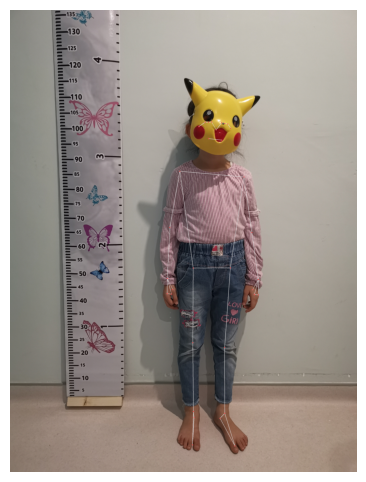

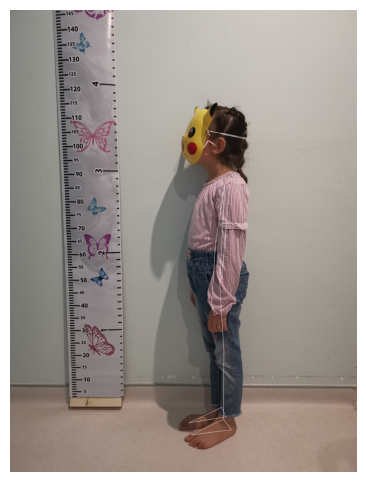

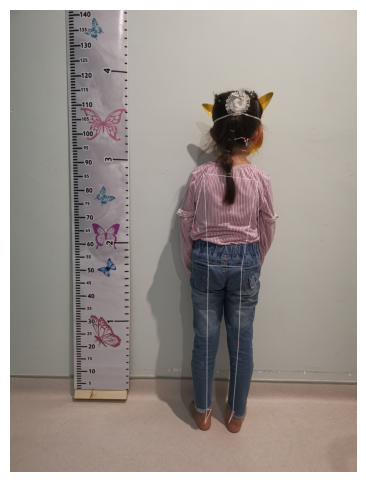

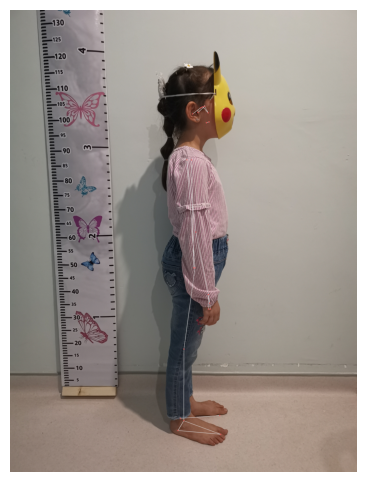

In [ ]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True)
mp_drawing = mp.solutions.drawing_utils

def visualize_pose(image_path):
    # Read image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process with MediaPipe
    results = pose.process(image_rgb)

    if results.pose_landmarks:
        # Draw landmarks
        annotated_image = image.copy()
        mp_drawing.draw_landmarks(
            annotated_image,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS
        )

        # Show with matplotlib
        plt.figure(figsize=(6,6))
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.show()
    else:
        print(f"No pose detected in {image_path}")

# Example usage
visualize_pose("/content/child0100_child0100_01.jpg")
visualize_pose("/content/child0100_child0100_02.jpg")
visualize_pose("/content/child0100_child0100_03.jpg")
visualize_pose("/content/child0100_child0100_04.jpg")


### traing on multifeautres


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, r2_score

# -----------------------------
# 1. Load your extracted features
# -----------------------------
# Suppose you already saved feature dataset as CSV
df = pd.read_csv("/content/features.csv")

# # Target columns
# target_height = "height in cm"
# target_weight = "weight in grams"   # <- if you have weight, else ignore

# # Feature columns (drop IDs, gender, targets)
# features = df.drop(columns=["filename", "gender", "age in months", target_height, target_weight])

# X = features
# y_height = df[target_height]
# y_weight = df[target_weight]

# # Train-test split
# X_train, X_test, y_train_h, y_test_h = train_test_split(X, y_height, test_size=0.2, random_state=42)
# _, _, y_train_w, y_test_w = train_test_split(X, y_weight, test_size=0.2, random_state=42)



#

In [ ]:
# -----------------------------
# 2. Random Forest Regressor (Height)
# -----------------------------
rf_params = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4]
}

rf = GridSearchCV(RandomForestRegressor(random_state=42), rf_params,
                  cv=3, scoring="neg_mean_absolute_error", n_jobs=-1, verbose=1)
rf.fit(X_train, y_train_h)

best_rf = rf.best_estimator_

# Predictions
train_pred_h = best_rf.predict(X_train)
test_pred_h = best_rf.predict(X_test)

print("Random Forest (Height):")
print("Train MAE:", mean_absolute_error(y_train_h, train_pred_h))
print("Test MAE:", mean_absolute_error(y_test_h, test_pred_h))
print("Train R2:", r2_score(y_train_h, train_pred_h))
print("Test R2:", r2_score(y_test_h, test_pred_h))


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Random Forest (Height):
Train MAE: 5.496409879714169
Test MAE: 13.789941574805317
Train R2: 0.6006442302489926
Test R2: -0.15497900449786584


In [ ]:
# -----------------------------
# 3. XGBoost Regressor (Height)
# -----------------------------
xgb_params = {
    "n_estimators": [200, 400],
    "max_depth": [3, 5, 7],
    "learning_rate": [0.01, 0.1, 0.2],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

xgb = GridSearchCV(XGBRegressor(random_state=42, objective="reg:squarederror"),
                   xgb_params, cv=3, scoring="neg_mean_absolute_error", n_jobs=-1, verbose=1)
xgb.fit(X_train, y_train_h)

best_xgb = xgb.best_estimator_

train_pred_xgb_h = best_xgb.predict(X_train)
test_pred_xgb_h = best_xgb.predict(X_test)

print("\nXGBoost (Height):")
print("Train MAE:", mean_absolute_error(y_train_h, train_pred_xgb_h))
print("Test MAE:", mean_absolute_error(y_test_h, test_pred_xgb_h))
print("Train R2:", r2_score(y_train_h, train_pred_xgb_h))
print("Test R2:", r2_score(y_test_h, test_pred_xgb_h))


Fitting 3 folds for each of 72 candidates, totalling 216 fits

XGBoost (Height):
Train MAE: 5.233036936065297
Test MAE: 13.84614490327381
Train R2: 0.6801042449446244
Test R2: -0.15283670137268324


In [ ]:
# -----------------------------
# 4. Repeat for WEIGHT
# -----------------------------
# Random Forest
rf.fit(X_train, y_train_w)
best_rf_w = rf.best_estimator_

train_pred_w = best_rf_w.predict(X_train)
test_pred_w = best_rf_w.predict(X_test)

print("\nRandom Forest (Weight):")
print("Train MAE:", mean_absolute_error(y_train_w, train_pred_w))
print("Test MAE:", mean_absolute_error(y_test_w, test_pred_w))
print("Train R2:", r2_score(y_train_w, train_pred_w))
print("Test R2:", r2_score(y_test_w, test_pred_w))

# XGBoost
xgb.fit(X_train, y_train_w)
best_xgb_w = xgb.best_estimator_

train_pred_xgb_w = best_xgb_w.predict(X_train)
test_pred_xgb_w = best_xgb_w.predict(X_test)

print("\nXGBoost (Weight):")
print("Train MAE:", mean_absolute_error(y_train_w, train_pred_xgb_w))
print("Test MAE:", mean_absolute_error(y_test_w, test_pred_xgb_w))
print("Train R2:", r2_score(y_train_w, train_pred_xgb_w))
print("Test R2:", r2_score(y_test_w, test_pred_xgb_w))


Fitting 3 folds for each of 108 candidates, totalling 324 fits

Random Forest (Weight):
Train MAE: 2187.277987686785
Test MAE: 4677.015147258148
Train R2: 0.6108376601270136
Test R2: -0.14499848790686531
Fitting 3 folds for each of 72 candidates, totalling 216 fits

XGBoost (Weight):
Train MAE: 1970.0667724609375
Test MAE: 4674.23046875
Train R2: 0.6909189224243164
Test R2: -0.14106571674346924


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, r2_score

# Assume your dataframe is `df`
# Encode gender
df['gender'] = df['gender'].map({'f': 0, 'm': 1})

# Features and targets
X = df.drop(columns=["gender","filename",'height in cm', 'weight in grams'])  # adjust if weight column is different
y_height = df['height in cm']
y_weight = df['weight in grams']

# Train/test split
X_train, X_test, y_height_train, y_height_test = train_test_split(X, y_height, test_size=0.1, random_state=42)
_, _, y_weight_train, y_weight_test = train_test_split(X, y_weight, test_size=0.1, random_state=42)

# Evaluation function
def evaluate_model(model, X_train, X_test, y_train, y_test, label):
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    print(f"\n{label} Results:")
    print(f"Train MAE: {mean_absolute_error(y_train, y_train_pred):.2f}")
    print(f"Test MAE: {mean_absolute_error(y_test, y_test_pred):.2f}")
    print(f"Train R²: {r2_score(y_train, y_train_pred):.2f}")
    print(f"Test R²: {r2_score(y_test, y_test_pred):.2f}")

# Random Forest & XGBoost for Height
rf_height = RandomForestRegressor(random_state=42)
xgb_height = XGBRegressor(random_state=42, verbosity=0)

evaluate_model(rf_height, X_train, X_test, y_height_train, y_height_test, "Height - Random Forest")
evaluate_model(xgb_height, X_train, X_test, y_height_train, y_height_test, "Height - XGB")

# Random Forest & XGBoost for Weight
rf_weight = RandomForestRegressor(random_state=42)
xgb_weight = XGBRegressor(random_state=42, verbosity=0)

evaluate_model(rf_weight, X_train, X_test, y_weight_train, y_weight_test, "Weight - Random Forest")
evaluate_model(xgb_weight, X_train, X_test, y_weight_train, y_weight_test, "Weight - XGB")



Height - Random Forest Results:
Train MAE: 2.52
Test MAE: 7.52
Train R²: 0.91
Test R²: 0.55

Height - XGB Results:
Train MAE: 0.00
Test MAE: 8.44
Train R²: 1.00
Test R²: 0.45

Weight - Random Forest Results:
Train MAE: 1033.29
Test MAE: 2083.36
Train R²: 0.92
Test R²: 0.73

Weight - XGB Results:
Train MAE: 0.00
Test MAE: 2240.64
Train R²: 1.00
Test R²: 0.67


In [ ]:

print(X_train.head())
print(y_height_train.head())
y_height.info()

    gender  age_in_months  max_torso_length  avg_torso_length  max_leg_length  \
53     NaN             48          0.233457          0.219172        0.281937   
22     NaN             84          0.265243          0.245079        0.379519   
68     NaN             50          0.242091          0.222017        0.271674   
44     NaN             28          0.271012          0.252867        0.380182   
98     NaN             41          0.226806          0.213657        0.363568   

    avg_leg_length  max_arm_length  avg_arm_length  max_head_to_shoulder  \
53        0.254836        0.244967        0.203477              0.123535   
22        0.340324        0.302818        0.258846              0.144558   
68        0.253017        0.280205        0.217149              0.128811   
44        0.323907        0.303389        0.266600              0.151805   
98        0.300205        0.315320        0.163745              0.103790   

    avg_head_to_shoulder  max_shoulder_width  avg_should

### Focal length and Trignometric approach


Estimated Height: 0.75 m
Estimated Distance: 1.87 m


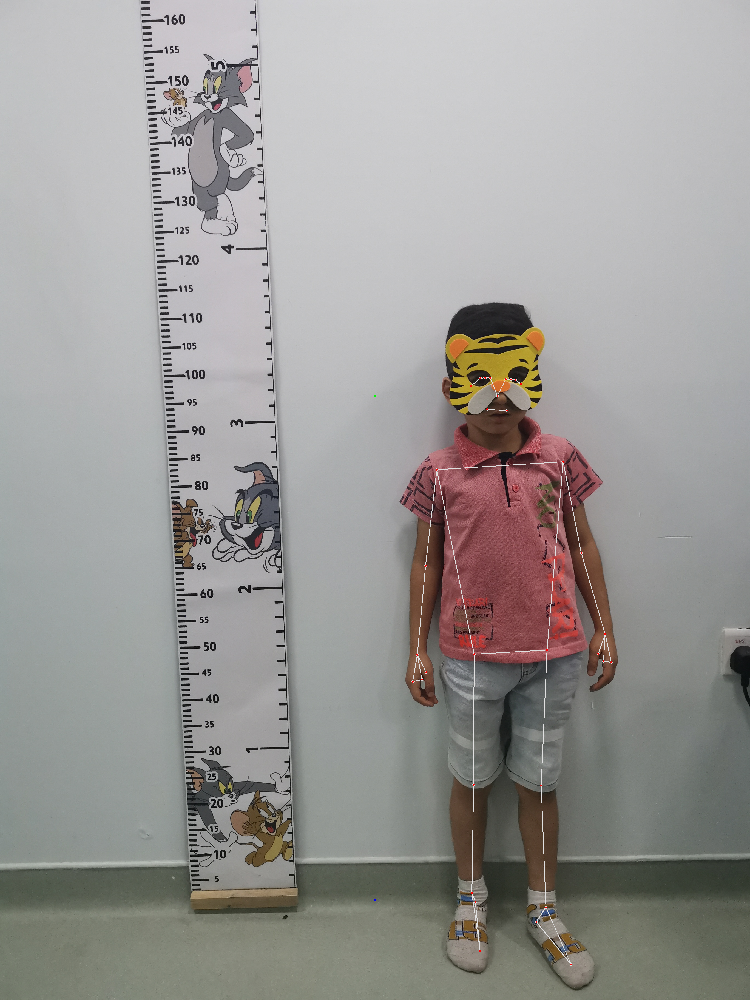

In [ ]:
import cv2
import mediapipe as mp
import math
from google.colab.patches import cv2_imshow
# ============== Height Estimation Function =================
def estimate_height(focal_mm, sensor_height_mm, image_height_px,
                    camera_height_mm, camera_pitch_deg,
                    y_head_px, y_feet_px, cy=None):
    if cy is None:
        cy = image_height_px / 2.0

    f_px = focal_mm * (image_height_px / sensor_height_mm)
    delta_feet = (y_feet_px - cy)
    theta_feet = math.atan(delta_feet / f_px)
    alpha = math.radians(camera_pitch_deg) + theta_feet
    Z_mm = camera_height_mm / math.tan(alpha)
    h_px = abs(y_feet_px - y_head_px)
    H_mm = (h_px * Z_mm) / f_px
    return H_mm, Z_mm

# ============== Mediapipe Pose Setup =================
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

def process_image(image_path,
                  focal_mm=6.0,
                  sensor_height_mm=4.8,
                  camera_height_mm=1200,
                  camera_pitch_deg=15.0):
    image = cv2.imread(image_path)
    h, w, _ = image.shape

    with mp_pose.Pose(static_image_mode=True) as pose:
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

        if not results.pose_landmarks:
            print("❌ No person detected.")
            return None, None

        landmarks = results.pose_landmarks.landmark

        # Get head (nose) and feet (left/right ankle, take average)
        y_head_px = int(landmarks[mp_pose.PoseLandmark.NOSE].y * h)
        y_ankle_l = int(landmarks[mp_pose.PoseLandmark.LEFT_ANKLE].y * h)
        y_ankle_r = int(landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE].y * h)
        y_feet_px = int((y_ankle_l + y_ankle_r) / 2)

        H_mm, Z_mm = estimate_height(
            focal_mm, sensor_height_mm, h,
            camera_height_mm, camera_pitch_deg,
            y_head_px, y_feet_px
        )

        print(f"Estimated Height: {H_mm/1000:.2f} m")
        print(f"Estimated Distance: {Z_mm/1000:.2f} m")

        # Draw landmarks for visualization
        mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
        cv2.circle(image, (w//2, y_head_px), 5, (0, 255, 0), -1)  # head
        cv2.circle(image, (w//2, y_feet_px), 5, (255, 0, 0), -1)  # feet

        cv2_imshow( image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return H_mm, Z_mm


# ============== Run Example =================
if __name__ == "__main__":
    image_path = "child0010_child0010_01.jpg"  # replace with your test image
    H_mm, Z_mm = process_image(image_path)


### optuna hyperparameter training

In [ ]:
!pip install optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 9.3 MB/s eta 0:00:00


In [ ]:
import optuna
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")

# -------------------
# Load Dataset
# -------------------
df = pd.read_csv("multi_view_features_all_side.csv")

# Drop ID column
df = df.drop(columns=["child_id"])

# Encode gender (m=0, f=1)
df["gender"] = LabelEncoder().fit_transform(df["gender"].astype(str))

# Choose target -> Example: Height
target_col = "height_in_cm"
X = df.drop(columns=[target_col, "weight_in_grams"]).values
y = df[target_col].values

# -------------------
# Optuna Objective
# -------------------
def objective(trial):
    model_name = trial.suggest_categorical("model", ["ridge", "random_forest", "lgbm", "svr", "xgboost"])

    if model_name == "ridge":
        alpha = trial.suggest_float("ridge_alpha", 1e-3, 100.0, log=True)
        model = Ridge(alpha=alpha, random_state=2024)

    elif model_name == "random_forest":
        model = RandomForestRegressor(
            n_estimators=trial.suggest_int("rf_n_estimators", 50, 500),
            max_depth=trial.suggest_int("rf_max_depth", 2, 10),
            min_samples_split=trial.suggest_int("rf_min_samples_split", 2, 20),
            min_samples_leaf=trial.suggest_int("rf_min_samples_leaf", 1, 10),
            max_features=trial.suggest_categorical("rf_max_features", ["sqrt", "log2", None]),
            random_state=2024,
            n_jobs=-1
        )

    elif model_name == "lgbm":
        model = LGBMRegressor(
            num_leaves=trial.suggest_int("lgb_num_leaves", 20, 200),
            max_depth=trial.suggest_int("lgb_max_depth", 3, 12),
            learning_rate=trial.suggest_float("lgb_learning_rate", 1e-3, 0.3, log=True),
            n_estimators=trial.suggest_int("lgb_n_estimators", 50, 500),
            min_child_samples=trial.suggest_int("lgb_min_child_samples", 5, 50),
            reg_alpha=trial.suggest_float("lgb_reg_alpha", 0.0, 10.0),
            reg_lambda=trial.suggest_float("lgb_reg_lambda", 0.0, 10.0),
            random_state=2024,
            n_jobs=-1
        )

    elif model_name == "svr":
        C = trial.suggest_float("svr_C", 1e-4, 10.0, log=True)
        epsilon = trial.suggest_float("svr_epsilon", 0.01, 1.0)
        kernel = trial.suggest_categorical("svr_kernel", ["linear", "rbf"])
        gamma = trial.suggest_categorical("svr_gamma", ["scale", "auto"])
        model = SVR(C=C, epsilon=epsilon, kernel=kernel, gamma=gamma)

    elif model_name == "xgboost":
        model = XGBRegressor(
            n_estimators=trial.suggest_int("xgb_n_estimators", 50, 500),
            max_depth=trial.suggest_int("xgb_max_depth", 2, 12),
            learning_rate=trial.suggest_float("xgb_learning_rate", 1e-3, 0.3, log=True),
            subsample=trial.suggest_float("xgb_subsample", 0.5, 1.0),
            colsample_bytree=trial.suggest_float("xgb_colsample_bytree", 0.5, 1.0),
            reg_alpha=trial.suggest_float("xgb_reg_alpha", 0.0, 10.0),
            reg_lambda=trial.suggest_float("xgb_reg_lambda", 0.0, 10.0),
            random_state=2024,
            n_jobs=-1
        )

    # -------------------
    # K-Fold Cross Validation
    # -------------------
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    maes = []

    for train_idx, val_idx in kf.split(X):
        x_train_fold, x_val_fold = X[train_idx], X[val_idx]
        y_train_fold, y_val_fold = y[train_idx], y[val_idx]

        model.fit(x_train_fold, y_train_fold)

        y_pred = model.predict(x_val_fold)
        mae = mean_absolute_error(y_val_fold, y_pred)
        maes.append(mae)

    return np.mean(maes)

# -------------------
# Run Optuna Study
# -------------------
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=100)

print("Best MAE:", study.best_value)
print("Best parameters:", study.best_params)


[I 2025-09-29 10:52:15,944] A new study created in memory with name: no-name-d8582328-da04-4119-9678-fdc6c1a4bfcd


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-09-29 10:52:18,188] Trial 0 finished with value: 7.921118570747041 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 24, 'lgb_max_depth': 3, 'lgb_learning_rate': 0.26063100301368974, 'lgb_n_estimators': 252, 'lgb_min_child_samples': 10, 'lgb_reg_alpha': 6.822467610222499, 'lgb_reg_lambda': 6.407562105809015}. Best is trial 0 with value: 7.921118570747041.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:19,089] Trial 1 finished with value: 7.675763027831124 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 64, 'lgb_max_depth': 12, 'lgb_learning_rate': 0.04663825373165398, 'lgb_n_estimators': 159, 'lgb_min_child_samples': 31, 'lgb_reg_alpha': 2.9298273666364616, 'lgb_reg_lambda': 0.4921540153770698}. Best is trial 1 with value: 7.675763027831124.
[I 2025-09-29 10:52:21,927] Trial 2 finished with value: 8.623696899414062 and parameters: {'model': 'xgboost', 'xgb_n_estimators': 292, 'xgb_max_depth': 2, 'xgb_learning_rate': 0.002736525025052448, 'xgb_subsample': 0.8775237120985464, 'xgb_colsample_bytree': 0.6919223965230353, 'xgb_reg_alpha': 9.91011936838075, 'xgb_reg_lambda': 2.723829294594787}. Best is trial 1 with value: 7.675763027831124.
[I 2025-09-29 10:52:21,958] Trial 3 finished with value: 6.173222003034678 and parameters: {'model': 'svr', 'svr_C': 0.061460714745954624, 'svr_epsilon': 0.11164629617409869, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best i

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:32,784] Trial 9 finished with value: 7.681006450201659 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 112, 'lgb_max_depth': 7, 'lgb_learning_rate': 0.058622781997605886, 'lgb_n_estimators': 268, 'lgb_min_child_samples': 5, 'lgb_reg_alpha': 8.603268003945278, 'lgb_reg_lambda': 4.87783542333831}. Best is trial 3 with value: 6.173222003034678.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-09-29 10:52:32,851] Trial 10 finished with value: 7.166420737734289 and parameters: {'model': 'svr', 'svr_C': 2.3361817836379815, 'svr_epsilon': 0.8819075753375851, 'svr_kernel': 'rbf', 'svr_gamma': 'auto'}. Best is trial 3 with value: 6.173222003034678.
[I 2025-09-29 10:52:32,874] Trial 11 finished with value: 6.175377725698814 and parameters: {'model': 'svr', 'svr_C': 0.006662410089670225, 'svr_epsilon': 0.19467719026938027, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 3 with value: 6.173222003034678.
[I 2025-09-29 10:52:32,907] Trial 12 finished with value: 6.173663528416659 and parameters: {'model': 'svr', 'svr_C': 0.0651337724809223, 'svr_epsilon': 0.06393947727038998, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 3 with value: 6.173222003034678.
[I 2025-09-29 10:52:32,955] Trial 13 finished with value: 6.1970580597307166 and parameters: {'model': 'svr', 'svr_C': 0.43332540944278486, 'svr_epsilon': 0.06045734755633033, 'svr_kernel': 'linear',

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 0
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

[I 2025-09-29 10:52:45,136] Trial 30 finished with value: 7.7534280855166315 and parameters: {'model': 'random_forest', 'rf_n_estimators': 413, 'rf_max_depth': 10, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 1, 'rf_max_features': 'sqrt'}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:45,161] Trial 31 finished with value: 6.173711163081324 and parameters: {'model': 'svr', 'svr_C': 0.017063856097403594, 'svr_epsilon': 0.015036471557169641, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:45,180] Trial 32 finished with value: 6.171998135590984 and parameters: {'model': 'svr', 'svr_C': 0.0055385805144142885, 'svr_epsilon': 0.018913800185999308, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:45,226] Trial 33 finished with value: 10.232080125034056 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 199, 'lgb_max_depth': 3, 'lgb_lea

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 0
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

[I 2025-09-29 10:52:45,557] Trial 34 finished with value: 10.11597431001209 and parameters: {'model': 'xgboost', 'xgb_n_estimators': 61, 'xgb_max_depth': 12, 'xgb_learning_rate': 0.001014047934435435, 'xgb_subsample': 0.6130625997285133, 'xgb_colsample_bytree': 0.5362548313906874, 'xgb_reg_alpha': 0.5113774906573649, 'xgb_reg_lambda': 0.14510208632300703}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:45,579] Trial 35 finished with value: 6.218928087194124 and parameters: {'model': 'svr', 'svr_C': 0.0041083226877463375, 'svr_epsilon': 0.13194458933142833, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:45,595] Trial 36 finished with value: 6.332923554181197 and parameters: {'model': 'ridge', 'ridge_alpha': 67.50459911502878}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:46,802] Trial 37 finished with value: 7.368839209420341 and parameters: {'model': 'xgboost', 'xgb_n_estimat

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:47,075] Trial 40 finished with value: 7.551280478709965 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 127, 'lgb_max_depth': 8, 'lgb_learning_rate': 0.01025561192873177, 'lgb_n_estimators': 427, 'lgb_min_child_samples': 26, 'lgb_reg_alpha': 4.2888276131498335, 'lgb_reg_lambda': 9.869735566006572}. Best is trial 24 with value: 6.154095982885549.
[I 2025-09-29 10:52:47,108] Trial 41 finished with value: 6.150309791844735 and parameters: {'model': 'svr', 'svr_C': 0.011217592514697623, 'svr_epsilon': 0.01909734125312982, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:47,132] Trial 42 finished with value: 6.160245265123253 and parameters: {'model': 'svr', 'svr_C': 0.008292444142981336, 'svr_epsilon': 0.12332499613843206, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:47,157] Trial 43 finished with value: 6.167435767771446 and parame

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:50,476] Trial 62 finished with value: 6.214234237939356 and parameters: {'model': 'svr', 'svr_C': 0.0030089836644129676, 'svr_epsilon': 0.07893018966654049, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:50,500] Trial 63 finished with value: 6.1811719416683255 and parameters: {'model': 'svr', 'svr_C': 0.01096994009158997, 'svr_epsilon': 0.4313048455045998, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:50,523] Trial 64 finished with value: 6.20907534170493 and parameters: {'model': 'svr', 'svr_C': 0.007780994644532931, 'svr_epsilon': 0.9837423994763309, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:50,549] Trial 65 finished with value: 6.210486664841476 and parameters: {'model': 'svr', 'svr_C': 0.09420072360749128, 'svr_epsilon': 0.5954583702314233, 'svr_kernel': '

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:54,684] Trial 83 finished with value: 6.172287096384098 and parameters: {'model': 'svr', 'svr_C': 0.013324707607548366, 'svr_epsilon': 0.03788691129223734, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:54,719] Trial 84 finished with value: 6.175422598980756 and parameters: {'model': 'svr', 'svr_C': 0.005879479893946296, 'svr_epsilon': 0.20926280591384655, 'svr_kernel': 'linear', 'svr_gamma': 'scale'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:57,622] Trial 85 finished with value: 8.248087861808235 and parameters: {'model': 'random_forest', 'rf_n_estimators': 252, 'rf_max_depth': 8, 'rf_min_samples_split': 6, 'rf_min_samples_leaf': 6, 'rf_max_features': 'log2'}. Best is trial 41 with value: 6.150309791844735.
[I 2025-09-29 10:52:57,648] Trial 86 finished with value: 6.149897484558304 and parameters: {'model': 'svr', 'svr_C': 0.011396272679841666, 'svr_epsilon': 0.0104192250

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 19
[LightGBM] [Info] Start training from score 109.333333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-09-29 10:52:58,682] Trial 99 finished with value: 7.385291425018013 and parameters: {'model': 'lgbm', 'lgb_num_leaves': 157, 'lgb_max_depth': 5, 'lgb_learning_rate': 0.0040396053247538765, 'lgb_n_estimators': 368, 'lgb_min_child_samples': 16, 'lgb_reg_alpha': 2.906835612120064, 'lgb_reg_lambda': 2.5822325568840703}. Best is trial 86 with value: 6.149897484558304.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split

def plot_model_learning_curve(model_class, best_params, x_train, y_train, x_test, y_test, train_sizes=None, random_state=42):
    """
    Plots a learning curve for a regression model using MAE.

    Parameters:
    - model_class: model class (e.g., LGBMRegressor, SVR)
    - best_params: dict, model parameters
    - x_train, y_train: Training data
    - x_test, y_test: Test data
    - train_sizes: List/array of fractions of training data to use (default: np.linspace(0.1, 1.0, 10))
    - random_state: For reproducibility
    """
    if train_sizes is None:
        train_sizes = np.linspace(0.1, 1.0, 10)

    train_scores = []
    test_scores = []

    for frac in train_sizes:
        if frac < 1.0:
            X_sub, _, y_sub, _ = train_test_split(
                x_train, y_train,
                train_size=frac,
                random_state=random_state
            )
        else:
            X_sub, y_sub = x_train, y_train  # Use full training data

        model = model_class(**best_params)
        model.fit(X_sub, y_sub)

        y_train_pred = model.predict(X_sub)
        y_test_pred = model.predict(x_test)

        train_mae = mean_absolute_error(y_sub, y_train_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)

        train_scores.append(train_mae)
        test_scores.append(test_mae)

    # Plotting
    plt.figure(figsize=(8, 6))
    sample_counts = train_sizes * len(x_train)
    plt.plot(sample_counts, train_scores, label="Train MAE", marker='o')
    plt.plot(sample_counts, test_scores, label="Test MAE", marker='s')
    plt.xlabel("Number of training samples")
    plt.ylabel("Mean Absolute Error (MAE)")
    plt.title("Learning Curve")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


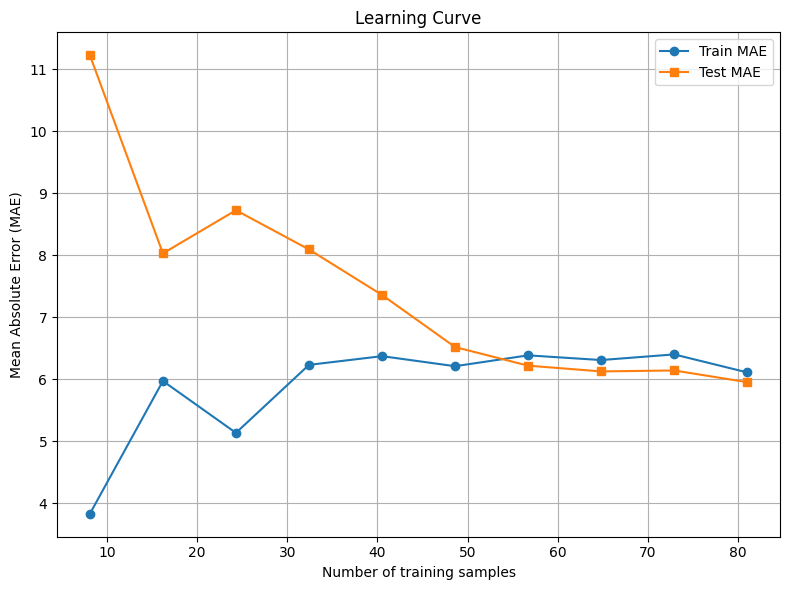

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split

# Split data into train/test
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

best_params = {
    'C': 0.007752522403517577,
    'epsilon': 0.1594593749092818,
    'kernel': 'linear',
    'gamma': 'auto'
}

plot_model_learning_curve(SVR, best_params, x_train, y_train, x_test, y_test)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from scipy.optimize import curve_fit

def learning_curve_with_projection(model_class, best_params, X, y, train_sizes=None, random_state=42, project_to=1000):
    if train_sizes is None:
        train_sizes = np.linspace(0.1, 1.0, 10)  # 10%-100%

    # Train-test split
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

    train_scores, test_scores, sample_counts = [], [], []

    for frac in train_sizes:
        if frac < 1.0:
            X_sub, _, y_sub, _ = train_test_split(
                x_train, y_train, train_size=frac, random_state=random_state
            )
        else:
            X_sub, y_sub = x_train, y_train

        model = model_class(**best_params)
        model.fit(X_sub, y_sub)

        y_train_pred = model.predict(X_sub)
        y_test_pred = model.predict(x_test)

        train_scores.append(mean_absolute_error(y_sub, y_train_pred))
        test_scores.append(mean_absolute_error(y_test, y_test_pred))
        sample_counts.append(len(X_sub))

    # Fit a power law curve to extrapolate (MAE ≈ a * n^(-b) + c)
    def power_law(n, a, b, c):
        return a * np.power(n, -b) + c

    popt, _ = curve_fit(power_law, sample_counts, test_scores, maxfev=5000)

    # Extrapolate to more data points
    projected_samples = np.linspace(min(sample_counts), project_to, 100)
    projected_scores = power_law(projected_samples, *popt)

    # Plot
    plt.figure(figsize=(8,6))
    plt.plot(sample_counts, test_scores, "o-", label="Observed Test MAE")
    plt.plot(projected_samples, projected_scores, "r--", label=f"Projected to {project_to} samples")
    plt.xlabel("Number of training samples")
    plt.ylabel("Mean Absolute Error (MAE)")
    plt.title("Learning Curve with Projection")
    plt.legend()
    plt.grid(True)
    plt.show()


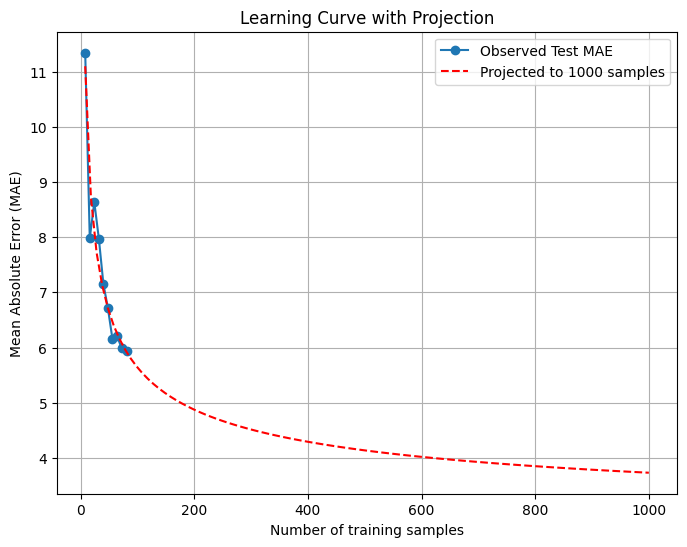

In [ ]:
best_params = {
    'C': 0.011485094041774616,
    'epsilon': 0.01850473778414663,
    'kernel': 'linear',
    'gamma': 'auto'
}

learning_curve_with_projection(SVR, best_params, X, y, project_to=1000)
